In [2]:
import arcpy

In [4]:
# Data Aggregation
arcpy.sa.ZonalStatisticsAsTable(
    in_zone_data="Pohang_Buk_Parcels_StudyArea_wgs84",
    zone_field="A1", 
    in_value_raster='Pohang_LOSdisplacement_ref129386E36132N_.img',
    out_table=r"C:\E\DinSAR\Results_251002\Data_Analysis\Revised_Data_Analysis\Revised_Data_Analysis.gdb\Displacement_Parcels",
    ignore_nodata="DATA",
    statistics_type="ALL",
    process_as_multidimensional="CURRENT_SLICE",
    percentile_values=[90],
    percentile_interpolation_type="AUTO_DETECT",
    circular_calculation="ARITHMETIC",
    circular_wrap_value=360,
    out_join_layer=r"C:\E\DinSAR\Results_251002\Data_Analysis\Revised_Data_Analysis\Pohang_Parcels_displacement"
)

<Result 'C:\\E\\DinSAR\\Results_251002\\Data_Analysis\\Revised_Data_Analysis\\Revised_Data_Analysis.gdb\\Displacement_Parcels'>

In [ ]:
arcpy.management.AddJoin(
    in_layer_or_view="Pohang_Parcels_Coherence_postTOpre_stat",
    in_field="A1",
    join_table="Pohang_Parcels_Coherence_pre_stat",
    join_field="A1",
    join_type="KEEP_ALL",
    index_join_fields="NO_INDEX_JOIN_FIELDS",
    rebuild_index="NO_REBUILD_INDEX",
    join_operation=""
)

arcpy.management.CalculateField(
    in_table="Pohang_Parcels_Coherence_postTOpre_stat",
    field="Pohang_Parcels_Coherence_postTOpre_stat.PreCoh",
    expression="!Pohang_Parcels_Coherence_pre_stat.MEDIAN!",
    expression_type="PYTHON3",
    code_block="",
    field_type="TEXT",
    enforce_domains="NO_ENFORCE_DOMAINS"
)

In [2]:
# -*- coding: utf-8 -*-
import arcpy

# --- INPUTS ---
gdb = r"C:\E\DinSAR\Results_251002\Data_Analysis\Revised_Data_Analysis\Revised_Data_Analysis.gdb"
fc_name = "Pohang_Parcels_Coher_PrePostPREPOST_EPSG5174"  # Feature class inside the GDB

# --- SETUP ---
arcpy.env.workspace = gdb
fc = arcpy.Describe(f"{gdb}\\{fc_name}").catalogPath  # FIXED

# Ensure Landuse field exists (TEXT, length 50)
field_names = [f.name for f in arcpy.ListFields(fc)]
if "LanduseK" not in field_names:
    arcpy.AddField_management(fc, "LanduseK", "TEXT", field_length=50)
    arcpy.management.CalculateField(
    in_table=fc,
    field="LanduseK",
    expression="!A5![-1]",
    expression_type="PYTHON3",
    code_block="",
    field_type="TEXT",
    enforce_domains="NO_ENFORCE_DOMAINS"
    )

if "Landuse" not in field_names:
    arcpy.AddField_management(fc, "Landuse", "TEXT", field_length=50)

# Ensure LanduseKdes field exists (TEXT, length 50)
if "LanduseKdes" not in field_names:
    arcpy.AddField_management(fc, "LanduseKdes", "TEXT", field_length=50)

# Mapping: single Korean code (LanduseK) -> (Korean meaning, English meaning)
code_map = {
    "공": ("공원", "Park area"),
    "과": ("과수원", "Orchard"),
    "구": ("구거", "Drainage"),
    "답": ("답", "Rice paddy"),
    "대": ("대지", "Building site"),
    "도": ("도로", "Road"),
    "목": ("목장용지", "Ranch"),
    "묘": ("묘지", "Cemetery"),
    "사": ("사적지", "Historic site"),
    "수": ("수도용지", "Water supply site"),
    "양": ("양어장", "Fish farm"),
    "유": ("유지", "Reservoir"),
    "임": ("임야", "Forest"),
    "잡": ("잡종지", "Miscellaneous land"),
    "장": ("공장용지", "Factory site"),
    "전": ("전", "Farmland"),
    "제": ("제방", "Embankment"),
    "종": ("종교용지", "Religious site"),
    "주": ("주유소용지", "Gas station"),
    "차": ("주차장", "Parking lot"),
    "창": ("창고용지", "Warehouse"),
    "천": ("하천", "River"),
    "철": ("철도용지", "Railroad site"),
    "체": ("체육용지", "Sports facility"),
    "학": ("학교용지", "School site")
}

# --- UPDATE ---
updated = 0
missing = 0

with arcpy.da.UpdateCursor(fc, ["LanduseK", "Landuse", "LanduseKdes"]) as cur:
    for code, en, ko in cur:
        k = (code or "").strip()
        if not k:
            continue
        if k in code_map:
            ko_val, en_val = code_map[k]
        else:
            ko_val, en_val = ("미상", "Unknown")  # Default for unmapped
            missing += 1

        # Update if values differ
        if en != en_val or ko != ko_val:
            cur.updateRow((code, en_val, ko_val))
            updated += 1

arcpy.AddMessage(f"Updated rows: {updated}")
if missing:
    arcpy.AddWarning(f"Unmapped codes (set to Unknown/미상): {missing}")
print(f"Updated rows: {updated}; Unknowns: {missing}")


Updated rows: 76397; Unknowns: 0


In [4]:
# -*- coding: utf-8 -*-
import arcpy

# --- INPUTS ---
gdb = r"C:\E\DinSAR\Results_251002\Data_Analysis\Revised_Data_Analysis\Revised_Data_Analysis.gdb"
fc_name = "Pohang_Parcels_Coher_PrePostPREPOST_EPSG5174"  # Feature class inside the GDB

# --- SETUP ---
arcpy.env.workspace = gdb
fc = arcpy.Describe(f"{gdb}\\{fc_name}").catalogPath  # FIXED

# Ensure LanduseCat field exists (TEXT, length 20)
field_names = [f.name for f in arcpy.ListFields(fc)]
if "LanduseCat" not in field_names:
    arcpy.AddField_management(fc, "LanduseCat", "TEXT", field_length=20)

# --- Categorization rules ---
natural = {"공", "과", "답", "목", "묘", "유", "임", "전", "천"}
artificial = {"구", "대", "도", "수", "장", "제", "종", "주", "차", "창", "철"}
mixed = {"사", "양", "잡", "체", "학"}

def categorize(code):
    if code in natural:
        return "Natural use"
    elif code in artificial:
        return "Artificial use"
    elif code in mixed:
        return "Mixed use"
    else:
        return "Unknown"

# --- UPDATE ---
updated = 0
with arcpy.da.UpdateCursor(fc, ["LanduseK", "LanduseCat"]) as cur:
    for k, cat in cur:
        code = (k or "").strip()
        new_cat = categorize(code)
        if cat != new_cat:
            cur.updateRow((k, new_cat))
            updated += 1

arcpy.AddMessage(f"Updated rows: {updated}")
print(f"Updated rows: {updated}")


Updated rows: 76397


In [5]:
# -*- coding: utf-8 -*-
import arcpy
import pandas as pd
import numpy as np

# --------- INPUTS (edit these) ----------
gdb = r"C:\E\DinSAR\Results_251002\Data_Analysis\Revised_Data_Analysis\Revised_Data_Analysis.gdb"
fc_name = "Pohang_Parcels_Coher_PrePostPREPOST_EPSG5174"  # Feature class inside the GDB
landuse_code_field = "Landuse"             # single-char code
landuse_cat_field  = "LanduseCat"           # "Natural/Artificial/Mixed"

# ----------------------------------------

fc = f"{gdb}\\{fc_name}"
fields = [landuse_cat_field, landuse_code_field, "MEDIAN","PreCoh", "PostCoh"]

# Load attributes to pandas
rows = []
with arcpy.da.SearchCursor(fc, fields) as cur:
    for lu_cat, lu_code, med, pre, post in cur:
        # Skip the record if any of med, pre, or post is None
        if None in (med, pre, post): continue
        rows.append([lu_cat, lu_code, med, pre, post])

df = pd.DataFrame(rows, columns=["LanduseCat", "LanduseK", "PredPost","PreCoh","PostCoh"])

# Build row label as "Category | Code" (so you can see both at once)
df["RowLabel"] = df["LanduseCat"].astype(str) + " | " + df["LanduseK"].astype(str)

# Pivot: rows = category+code, columns = two Gi buckets, values = sum of area
pivot = pd.pivot_table(
    df,
    index="RowLabel",
    values=["PredPost","PreCoh","PostCoh"],
    aggfunc=["mean","std"],
    fill_value=0.0
)

# Print and optionally export
#pivot = pivot[["PreCoh", "PostCoh"]].sort_index()
print(pivot.columns)
print(pivot)

# Optional CSV export
#out_csv = r"C:\E\DinSAR\Results_251002\Data_Analysis\Revised_Data_Analysis\pivot_landuse_PrePost.csv"
pivot.to_csv(out_csv, encoding="utf-8-sig")
print(f"Saved pivot to: {out_csv}")


MultiIndex([('mean',  'PostCoh'),
            ('mean',   'PreCoh'),
            ('mean', 'PredPost'),
            ( 'std',  'PostCoh'),
            ( 'std',   'PreCoh'),
            ( 'std', 'PredPost')],
           )
Saved pivot to: C:\E\DinSAR\Results_251002\Data_Analysis\Revised_Data_Analysis\pivot_landuse_PrePost.csv


In [5]:
# -*- coding: utf-8 -*-
import arcpy
import pandas as pd
import numpy as np

# --------- INPUTS (edit these) ----------
gdb = r"C:\E\DinSAR\Results_251002\Data_Analysis\Revised_Data_Analysis\Revised_Data_Analysis.gdb"
fc_name = "Pohang_Parcels_Coher_PrePostPREPOSTDisp_NoNull_EPSG5174"  # Feature class inside the GDB
landuse_code_field = "Landuse"             # single-char code
landuse_cat_field  = "LanduseCat"           # "Natural/Artificial/Mixed"

# ----------------------------------------

fc = f"{gdb}\\{fc_name}"
fields = [landuse_cat_field, landuse_code_field, "MEDIAN","PreCoh", "PostCoh"]

# Load attributes to pandas
rows = []
with arcpy.da.SearchCursor(fc, fields) as cur:
    for lu_cat, lu_code, med, pre, post in cur:
        # Skip the record if any of med, pre, or post is None
        if None in (med, pre, post): continue
        rows.append([lu_cat, lu_code, med, pre, post])

df = pd.DataFrame(rows, columns=["LanduseCat", "LanduseK", "PrePost","PreCoh","PostCoh"])

# Build row label as "Category | Code" (so you can see both at once)
df["RowLabel"] = df["LanduseCat"].astype(str)

# Pivot: rows = category+code, columns = two Gi buckets, values = sum of area
pivot = pd.pivot_table(
    df,
    index="RowLabel",
    values=["PrePost","PreCoh","PostCoh"],
    aggfunc=["mean","std"],
    fill_value=0.0
)

# Print and optionally export
#pivot = pivot[["PreCoh", "PostCoh"]].sort_index()
print(pivot.columns)
print(pivot)

# Optional CSV export
#out_csv = r"C:\E\DinSAR\Results_251002\Data_Analysis\Revised_Data_Analysis\pivot_landuse_PrePost_cat.csv"
pivot.to_csv(out_csv, encoding="utf-8-sig")
print(f"Saved pivot to: {out_csv}")


MultiIndex([('mean', 'PostCoh'),
            ('mean',  'PreCoh'),
            ('mean', 'PrePost'),
            ( 'std', 'PostCoh'),
            ( 'std',  'PreCoh'),
            ( 'std', 'PrePost')],
           )
                    mean                           std                    
                 PostCoh    PreCoh   PrePost   PostCoh    PreCoh   PrePost
RowLabel                                                                  
Artificial use  0.587635  0.671110 -0.080751  0.214742  0.219619  0.172899
Mixed use       0.468052  0.532599 -0.061927  0.201533  0.217089  0.163265
Natural use     0.390297  0.386059  0.004272  0.164641  0.175343  0.170413
Saved pivot to: C:\E\DinSAR\Results_251002\Data_Analysis\Revised_Data_Analysis\pivot_landuse_PrePost_cat.csv


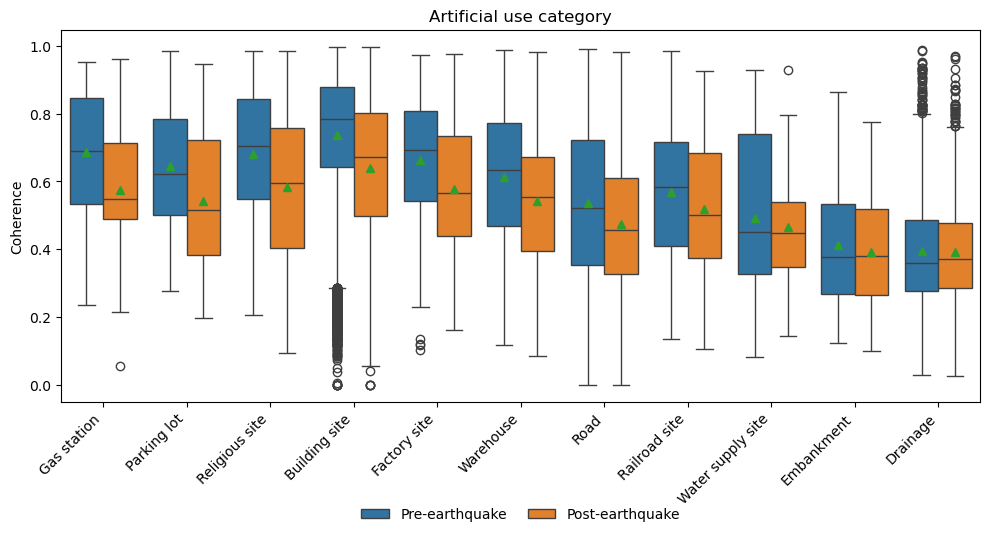

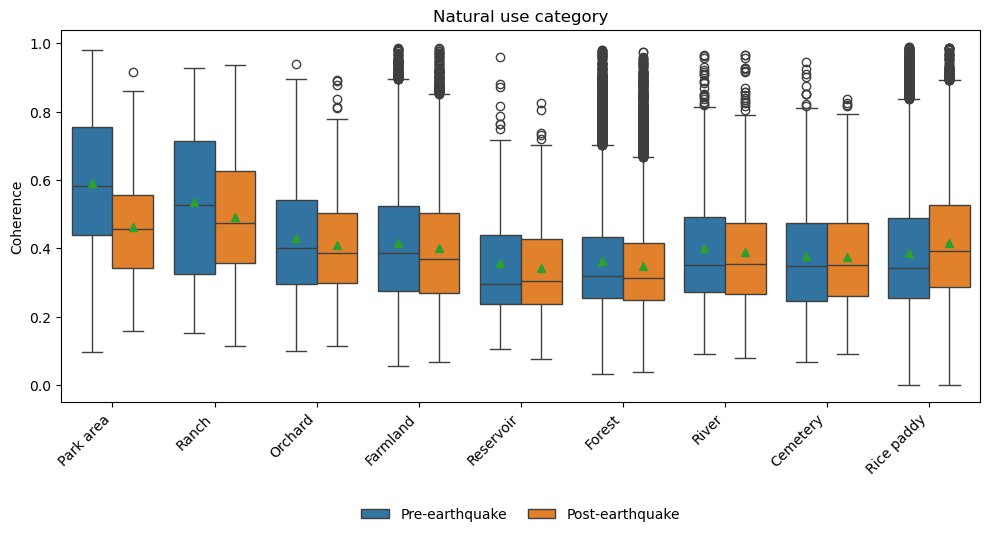

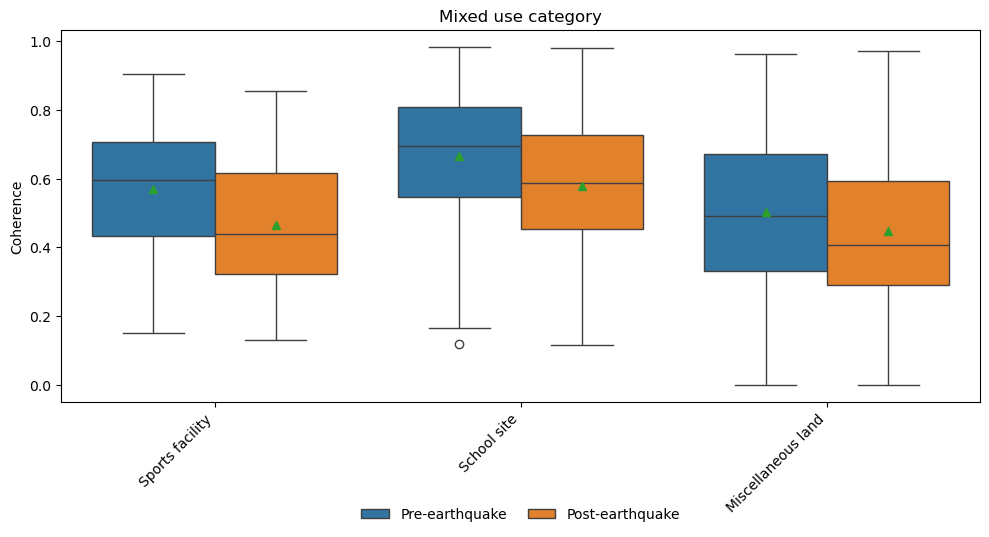

In [29]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# ---- Prepare data ----
df_melted = df.melt(
    id_vars=["LanduseCat", "LanduseK"],
    value_vars=["PreCoh", "PostCoh"],
    var_name="CohType",
    value_name="Coherence"
)

# ---- Define exclusions for Mixed ----
exclude_codes_mixed = ["Historic site", "Fish farm"]

# ---- Mapping for prettier legend labels ----
label_map = {
    "PreCoh": "Pre-earthquake",
    "PostCoh": "Post-earthquake"
}
df_melted["CohType"] = df_melted["CohType"].replace(label_map)

# ---- Plot each LanduseCat separately ----
for cat in df_melted["LanduseCat"].unique():
    subset = df_melted[df_melted["LanduseCat"] == cat].copy()

    # Exclude unwanted LanduseK for Mixed category
    if cat.lower() == "mixed use":
        subset = subset[~subset["LanduseK"].isin(exclude_codes_mixed)]

    # Compute mean Pre and Post coherence by LanduseK
    mean_vals = (
        subset.groupby(["LanduseK", "CohType"])["Coherence"]
        .mean()
        .unstack()  # Columns: Pre-earthquake, Post-earthquake
    )

    # Calculate difference (Pre - Post)
    mean_vals["Diff"] = mean_vals["Pre-earthquake"] - mean_vals["Post-earthquake"]

    # Order LanduseK by descending difference
    order = mean_vals.sort_values("Diff", ascending=False).index.tolist()

    # ---- Draw grouped boxplot ----
    plt.figure(figsize=(10, 6))
    ax = sns.boxplot(
        data=subset,
        x="LanduseK", y="Coherence",
        hue="CohType",
        order=order,
        showmeans=True
    )

    # ---- Title and axis labels ----
    plt.title(f"{cat} category", fontsize=12)
    plt.xlabel("")
    plt.ylabel("Coherence")
    plt.xticks(rotation=45, ha="right")

    # ---- Legend at bottom, not overlapping x-tick labels ----
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(
        handles, labels,
        loc="upper center",
        bbox_to_anchor=(0.5, -0.25),  # push legend below plot
        frameon=False,
        ncol=len(labels),
        columnspacing=1.5,
        handletextpad=0.8
    )

    plt.tight_layout(rect=[0, 0.05, 1, 1])  # add bottom margin
    plt.show()
"DisplacementAbs_Orig_6knn_LISA"

In [31]:
gdb = r"C:\E\DinSAR\Results_251002\Data_Analysis\Revised_Data_Analysis\Revised_Data_Analysis.gdb"
fc_name = "Coherence_Orig_6knn_LISA"  # Feature class inside the GDB
fc_name = "DisplacementAbs_Orig_6knn_LISA"
fc_name = "BivarSA_6knn"
fc = f"{gdb}\\{fc_name}"

field_names = [f.name for f in arcpy.ListFields(fc)]
if "LanduseKdes" not in field_names: arcpy.AddField_management(fc, "LanduseKdes", "TEXT", field_length=50)
if "Landuse" not in field_names: arcpy.AddField_management(fc, "Landuse", "TEXT", field_length=50)
if "LanduseK" not in field_names: arcpy.AddField_management(fc, "LanduseK", "TEXT", field_length=50)
if "LanduseK" not in field_names: arcpy.AddField_management(fc, "LanduseCat", "TEXT", field_length=50)


arcpy.management.AddJoin(
    in_layer_or_view=fc,
    in_field="SOURCE_ID",
    join_table=f"{gdb}\\Pohang_Parcels_Coher_PrePostPREPOSTDisp_NoNull_EPSG5174",
    join_field="OBJECTID",
    join_type="KEEP_ALL",
    index_join_fields="NO_INDEX_JOIN_FIELDS",
    rebuild_index="NO_REBUILD_INDEX",
    join_operation=""
)


<Result 'BivarSA_6knn_Layer'>

In [24]:
# -*- coding: utf-8 -*-
import arcpy

# --- INPUTS ---
gdb = r"C:\E\DinSAR\Results_251002\Data_Analysis\Revised_Data_Analysis\Revised_Data_Analysis.gdb"
fc_name = "Coherence_Orig_6knn_LISA"  # Feature class inside the GDB
fc_name = "DisplacementAbs_Orig_6knn_LISA"
# --- SETUP ---
arcpy.env.workspace = gdb
fc = arcpy.Describe(f"{gdb}\\{fc_name}").catalogPath  # FIXED

# Ensure LanduseCat field exists (TEXT, length 20)
field_names = [f.name for f in arcpy.ListFields(fc)]
if "LanduseCat" not in field_names:
    arcpy.AddField_management(fc, "LanduseCat", "TEXT", field_length=20)

# --- Categorization rules ---
natural = {"공", "과", "답", "목", "묘", "유", "임", "전", "천"}
artificial = {"구", "대", "도", "수", "장", "제", "종", "주", "차", "창", "철"}
mixed = {"사", "양", "잡", "체", "학"}

def categorize(code):
    if code in natural:
        return "Natural use"
    elif code in artificial:
        return "Artificial use"
    elif code in mixed:
        return "Mixed use"
    else:
        return "Unknown"

# --- UPDATE ---
updated = 0
with arcpy.da.UpdateCursor(fc, ["LanduseK", "LanduseCat"]) as cur:
    for k, cat in cur:
        code = (k or "").strip()
        new_cat = categorize(code)
        if cat != new_cat:
            cur.updateRow((k, new_cat))
            updated += 1

arcpy.AddMessage(f"Updated rows: {updated}")
print(f"Updated rows: {updated}")


Updated rows: 0


In [13]:
# -*- coding: utf-8 -*-
import arcpy
import pandas as pd
import numpy as np

# --------- INPUTS (edit these) ----------
gdb = r"C:\E\DinSAR\Results_251002\Data_Analysis\Revised_Data_Analysis\Revised_Data_Analysis.gdb"
fc_name = "Coherence_Orig_6knn_LISA"  # Feature class inside the GDB
landuse_code_field = "Landuse"             # single-char code
landuse_cat_field  = "LanduseCat"           # "Natural/Artificial/Mixed"

fc = f"{gdb}\\{fc_name}"
fields = [landuse_cat_field, landuse_code_field, "MEDIAN","COType"]
# ----------------------------------------

# Load attributes to pandas
rows = []
with arcpy.da.SearchCursor(fc, fields) as cur:
    for lu_cat, lu_code, med, COType in cur:
        # Skip the record if any of med, pre, or post is None
        if med==None: continue
        rows.append([lu_cat, lu_code, med, COType])

df = pd.DataFrame(rows, columns=["LanduseCat", "LanduseK", "MEDIAN","COType"])

# Build row label as "Category | Code" (so you can see both at once)
df["RowLabel"] = df["LanduseCat"].astype(str)

# Pivot: rows = category+code, columns = two Gi buckets, values = sum of area
pivot = pd.pivot_table(
    df,
    index="RowLabel",
    columns="COType",
    values=["MEDIAN"],
    aggfunc=["mean","std"],
    fill_value=0.0
)

# Print and optionally export
#pivot = pivot[["PreCoh", "PostCoh"]].sort_index()
print(pivot.columns)
print(pivot)

# Optional CSV export
out_csv = r"C:\E\DinSAR\Results_251002\Data_Analysis\Revised_Data_Analysis\pivot_landuseCat_CohChg_LISA.csv"
pivot.to_csv(out_csv, encoding="utf-8-sig")
print(f"Saved pivot to: {out_csv}")


MultiIndex([('mean', 'MEDIAN',   ''),
            ('mean', 'MEDIAN', 'HH'),
            ('mean', 'MEDIAN', 'HL'),
            ('mean', 'MEDIAN', 'LH'),
            ('mean', 'MEDIAN', 'LL'),
            ( 'std', 'MEDIAN',   ''),
            ( 'std', 'MEDIAN', 'HH'),
            ( 'std', 'MEDIAN', 'HL'),
            ( 'std', 'MEDIAN', 'LH'),
            ( 'std', 'MEDIAN', 'LL')],
           names=[None, None, 'COType'])
                    mean                                               std  \
                  MEDIAN                                            MEDIAN   
COType                          HH        HL        LH        LL             
RowLabel                                                                     
Artificial use -0.040879  0.162022  0.035140 -0.102038 -0.270226  0.123726   
Mixed use      -0.040340  0.143919  0.065484 -0.124827 -0.230598  0.138322   
Natural use    -0.013107  0.190571  0.057618 -0.111175 -0.233747  0.139248   

                               

In [19]:
# -*- coding: utf-8 -*-
import arcpy
import pandas as pd
import numpy as np

# --------- INPUTS (edit these) ----------
gdb = r"C:\E\DinSAR\Results_251002\Data_Analysis\Revised_Data_Analysis\Revised_Data_Analysis.gdb"
fc_name = "Coherence_Orig_6knn_LISA"  # Feature class inside the GDB
landuse_code_field = "Landuse"             # single-char code
landuse_cat_field  = "LanduseCat"           # "Natural/Artificial/Mixed"
val_fld = "Shape_Area"

fc = f"{gdb}\\{fc_name}"
fields = [landuse_cat_field, landuse_code_field, val_fld,"COType"]
# ----------------------------------------

# Load attributes to pandas
rows = []
with arcpy.da.SearchCursor(fc, fields) as cur:
    for lu_cat, lu_code, med, COType in cur:
        # Skip the record if any of med, pre, or post is None
        if med==None: continue
        rows.append([lu_cat, lu_code, med, COType])

df = pd.DataFrame(rows, columns=["LanduseCat", "LanduseK", val_fld,"COType"])

# Build row label as "Category | Code" (so you can see both at once)
df["RowLabel"] = df["LanduseCat"].astype(str) + " | " + df["LanduseK"].astype(str)

# Pivot: rows = category+code, columns = two Gi buckets, values = sum of area
pivot = pd.pivot_table(
    df,
    index="RowLabel",
    columns="COType",
    values=[val_fld],
    aggfunc=["sum"],
    fill_value=0.0
)

# Print and optionally export
#pivot = pivot[["PreCoh", "PostCoh"]].sort_index()
print(pivot.columns)
print(pivot)

# Optional CSV export
out_csv = r"C:\E\DinSAR\Results_251002\Data_Analysis\Revised_Data_Analysis\pivot_landuse_CohChg_LISA.csv"
pivot.to_csv(out_csv, encoding="utf-8-sig")
print(f"Saved pivot to: {out_csv}")


MultiIndex([('sum', 'Shape_Area',   ''),
            ('sum', 'Shape_Area', 'HH'),
            ('sum', 'Shape_Area', 'HL'),
            ('sum', 'Shape_Area', 'LH'),
            ('sum', 'Shape_Area', 'LL')],
           names=[None, None, 'COType'])
                                             sum                               \
                                      Shape_Area                                
COType                                                      HH             HL   
RowLabel                                                                        
Artificial use | Building site      6.944969e+06  3.124656e+05  237536.485447   
Artificial use | Drainage           2.102045e+06  5.790616e+05   35205.649401   
Artificial use | Embankment         6.718025e+04  7.987730e+03     145.296156   
Artificial use | Factory site       2.175659e+06  1.359762e+03   10924.512909   
Artificial use | Gas station        5.167901e+04  0.000000e+00    3933.304563   
Artificial use | Parking

In [27]:
# -*- coding: utf-8 -*-
import arcpy
import pandas as pd
import numpy as np

# --------- INPUTS (edit these) ----------
gdb = r"C:\E\DinSAR\Results_251002\Data_Analysis\Revised_Data_Analysis\Revised_Data_Analysis.gdb"
fc_name = "DisplacementAbs_Orig_6knn_LISA"  # Feature class inside the GDB
landuse_code_field = "Landuse"             # single-char code
landuse_cat_field  = "LanduseCat"           # "Natural/Artificial/Mixed"
val_fld = "Shape_Area"

fc = f"{gdb}\\{fc_name}"
fields = [landuse_cat_field, landuse_code_field, val_fld,"COType"]
# ----------------------------------------

# Load attributes to pandas
rows = []
with arcpy.da.SearchCursor(fc, fields) as cur:
    for lu_cat, lu_code, med, COType in cur:
        # Skip the record if any of med, pre, or post is None
        if med==None: continue
        rows.append([lu_cat, lu_code, med, COType])

df = pd.DataFrame(rows, columns=["LanduseCat", "LanduseK", val_fld,"COType"])

# Build row label as "Category | Code" (so you can see both at once)
df["RowLabel"] = df["LanduseCat"].astype(str) + " | " + df["LanduseK"].astype(str)

# Pivot: rows = category+code, columns = two Gi buckets, values = sum of area
pivot = pd.pivot_table(
    df,
    index="RowLabel",
    columns="COType",
    values=[val_fld],
    aggfunc=["sum"],
    fill_value=0.0
)

# Print and optionally export
#pivot = pivot[["PreCoh", "PostCoh"]].sort_index()
print(pivot.columns)
print(pivot)

# Optional CSV export
out_csv = r"C:\E\DinSAR\Results_251002\Data_Analysis\Revised_Data_Analysis\pivot_landuse_AbsDisp_LISA.csv"
pivot.to_csv(out_csv, encoding="utf-8-sig")
print(f"Saved pivot to: {out_csv}")


MultiIndex([('sum', 'Shape_Area',   ''),
            ('sum', 'Shape_Area', 'HH'),
            ('sum', 'Shape_Area', 'HL'),
            ('sum', 'Shape_Area', 'LH'),
            ('sum', 'Shape_Area', 'LL')],
           names=[None, None, 'COType'])
                                             sum                              \
                                      Shape_Area                               
COType                                                      HH            HL   
RowLabel                                                                       
Artificial use | Building site      5.777574e+06  1.180016e+06   2753.300784   
Artificial use | Drainage           1.194671e+06  1.055148e+06   1467.874829   
Artificial use | Embankment         2.731452e+04  3.680058e+04      0.000000   
Artificial use | Factory site       1.219016e+06  7.106480e+04      0.000000   
Artificial use | Gas station        3.545431e+04  4.751970e+03      0.000000   
Artificial use | Parking lot     

In [33]:

# -*- coding: utf-8 -*-
import arcpy
import pandas as pd
import numpy as np

# --------- INPUTS (edit these) ----------
gdb = r"C:\E\DinSAR\Results_251002\Data_Analysis\Revised_Data_Analysis\Revised_Data_Analysis.gdb"
fc_name = "BivarSA_6knn"  # Feature class inside the GDB
landuse_code_field = "Landuse"             # single-char code
landuse_cat_field  = "LanduseCat"           # "Natural/Artificial/Mixed"
val_fld = "Shape_Area"

fc = f"{gdb}\\{fc_name}"
fields = [landuse_cat_field, landuse_code_field, val_fld,"ASSOC_CAT"]
# ----------------------------------------

# Load attributes to pandas
rows = []
with arcpy.da.SearchCursor(fc, fields) as cur:
    for lu_cat, lu_code, med, COType in cur:
        # Skip the record if any of med, pre, or post is None
        if med==None: continue
        rows.append([lu_cat, lu_code, med, COType])

df = pd.DataFrame(rows, columns=["LanduseCat", "LanduseK", val_fld,"ASSOC_CAT"])

# Build row label as "Category | Code" (so you can see both at once)
df["RowLabel"] = df["LanduseCat"].astype(str) + " | " + df["LanduseK"].astype(str)

# Pivot: rows = category+code, columns = two Gi buckets, values = sum of area
pivot = pd.pivot_table(
    df,
    index="RowLabel",
    columns="ASSOC_CAT",
    values=[val_fld],
    aggfunc=["sum"],
    fill_value=0.0
)

# Print and optionally export
#pivot = pivot[["PreCoh", "PostCoh"]].sort_index()
print(pivot.columns)
print(pivot)

# Optional CSV export
out_csv = r"C:\E\DinSAR\Results_251002\Data_Analysis\Revised_Data_Analysis\pivot_landuse_Area_BivarLA.csv"
pivot.to_csv(out_csv, encoding="utf-8-sig")
print(f"Saved pivot to: {out_csv}")



MultiIndex([('sum', 'Shape_Area',       'High-High'),
            ('sum', 'Shape_Area',        'High-Low'),
            ('sum', 'Shape_Area',        'Low-High'),
            ('sum', 'Shape_Area',         'Low-Low'),
            ('sum', 'Shape_Area', 'Not Significant')],
           names=[None, None, 'ASSOC_CAT'])
                                             sum                              \
                                      Shape_Area                               
ASSOC_CAT                              High-High      High-Low      Low-High   
RowLabel                                                                       
Artificial use | Building site      3.460886e+05  5.200569e+05  7.553975e+05   
Artificial use | Drainage           7.766755e+05  3.276517e+05  2.199225e+05   
Artificial use | Embankment         2.142137e+04  1.025688e+04  1.452962e+02   
Artificial use | Factory site       1.648978e+04  1.369243e+05  6.775296e+04   
Artificial use | Gas station        1.007597e

In [34]:

# -*- coding: utf-8 -*-
import arcpy
import pandas as pd
import numpy as np

# --------- INPUTS (edit these) ----------
gdb = r"C:\E\DinSAR\Results_251002\Data_Analysis\Revised_Data_Analysis\Revised_Data_Analysis.gdb"
fc_name = "BivarSA_6knn"  # Feature class inside the GDB
landuse_code_field = "Landuse"             # single-char code
landuse_cat_field  = "LanduseCat"           # "Natural/Artificial/Mixed"
val_fld = "MEDIAN"

fc = f"{gdb}\\{fc_name}"
fields = [landuse_cat_field, landuse_code_field, val_fld,"ASSOC_CAT"]
# ----------------------------------------

# Load attributes to pandas
rows = []
with arcpy.da.SearchCursor(fc, fields) as cur:
    for lu_cat, lu_code, med, COType in cur:
        # Skip the record if any of med, pre, or post is None
        if med==None: continue
        rows.append([lu_cat, lu_code, med, COType])

df = pd.DataFrame(rows, columns=["LanduseCat", "LanduseK", val_fld,"ASSOC_CAT"])

# Build row label as "Category | Code" (so you can see both at once)
df["RowLabel"] = df["LanduseCat"].astype(str) + " | " + df["LanduseK"].astype(str)

# Pivot: rows = category+code, columns = two Gi buckets, values = sum of area
pivot = pd.pivot_table(
    df,
    index="RowLabel",
    columns="ASSOC_CAT",
    values=[val_fld],
    aggfunc=["mean","std"],
    fill_value=0.0
)

# Print and optionally export
#pivot = pivot[["PreCoh", "PostCoh"]].sort_index()
print(pivot.columns)
print(pivot)

# Optional CSV export
out_csv = r"C:\E\DinSAR\Results_251002\Data_Analysis\Revised_Data_Analysis\pivot_landuse_CohChg_BivarLA.csv"
pivot.to_csv(out_csv, encoding="utf-8-sig")
print(f"Saved pivot to: {out_csv}")



MultiIndex([('mean', 'MEDIAN',       'High-High'),
            ('mean', 'MEDIAN',        'High-Low'),
            ('mean', 'MEDIAN',        'Low-High'),
            ('mean', 'MEDIAN',         'Low-Low'),
            ('mean', 'MEDIAN', 'Not Significant'),
            ( 'std', 'MEDIAN',       'High-High'),
            ( 'std', 'MEDIAN',        'High-Low'),
            ( 'std', 'MEDIAN',        'Low-High'),
            ( 'std', 'MEDIAN',         'Low-Low'),
            ( 'std', 'MEDIAN', 'Not Significant')],
           names=[None, None, 'ASSOC_CAT'])
                                        mean                                \
                                      MEDIAN                                 
ASSOC_CAT                          High-High  High-Low  Low-High   Low-Low   
RowLabel                                                                     
Artificial use | Building site      0.092576  0.109112 -0.181825 -0.240513   
Artificial use | Drainage           0.085634  0.089202 

In [35]:

# -*- coding: utf-8 -*-
import arcpy
import pandas as pd
import numpy as np

# --------- INPUTS (edit these) ----------
gdb = r"C:\E\DinSAR\Results_251002\Data_Analysis\Revised_Data_Analysis\Revised_Data_Analysis.gdb"
fc_name = "BivarSA_6knn"  # Feature class inside the GDB
landuse_code_field = "Landuse"             # single-char code
landuse_cat_field  = "LanduseCat"           # "Natural/Artificial/Mixed"
val_fld = "MEDIAN"

fc = f"{gdb}\\{fc_name}"
fields = [landuse_cat_field, landuse_code_field, val_fld,"ASSOC_CAT"]
# ----------------------------------------

# Load attributes to pandas
rows = []
with arcpy.da.SearchCursor(fc, fields) as cur:
    for lu_cat, lu_code, med, COType in cur:
        # Skip the record if any of med, pre, or post is None
        if med==None: continue
        rows.append([lu_cat, lu_code, med, COType])

df = pd.DataFrame(rows, columns=["LanduseCat", "LanduseK", val_fld,"ASSOC_CAT"])

# Build row label as "Category | Code" (so you can see both at once)
df["RowLabel"] = df["LanduseCat"].astype(str)

# Pivot: rows = category+code, columns = two Gi buckets, values = sum of area
pivot = pd.pivot_table(
    df,
    index="RowLabel",
    columns="ASSOC_CAT",
    values=[val_fld],
    aggfunc=["mean","std"],
    fill_value=0.0
)

# Print and optionally export
#pivot = pivot[["PreCoh", "PostCoh"]].sort_index()
print(pivot.columns)
print(pivot)

# Optional CSV export
out_csv = r"C:\E\DinSAR\Results_251002\Data_Analysis\Revised_Data_Analysis\pivot_landuseCat_CohChg_BivarLA.csv"
pivot.to_csv(out_csv, encoding="utf-8-sig")
print(f"Saved pivot to: {out_csv}")



MultiIndex([('mean', 'MEDIAN',       'High-High'),
            ('mean', 'MEDIAN',        'High-Low'),
            ('mean', 'MEDIAN',        'Low-High'),
            ('mean', 'MEDIAN',         'Low-Low'),
            ('mean', 'MEDIAN', 'Not Significant'),
            ( 'std', 'MEDIAN',       'High-High'),
            ( 'std', 'MEDIAN',        'High-Low'),
            ( 'std', 'MEDIAN',        'Low-High'),
            ( 'std', 'MEDIAN',         'Low-Low'),
            ( 'std', 'MEDIAN', 'Not Significant')],
           names=[None, None, 'ASSOC_CAT'])
                    mean                                                \
                  MEDIAN                                                 
ASSOC_CAT      High-High  High-Low  Low-High   Low-Low Not Significant   
RowLabel                                                                 
Artificial use  0.093124  0.095646 -0.176427 -0.230357       -0.048255   
Mixed use       0.050821  0.092771 -0.157584 -0.181956       -0.050298   
N

In [1]:

# -*- coding: utf-8 -*-
import arcpy
import pandas as pd
import numpy as np

# --------- INPUTS (edit these) ----------
gdb = r"C:\E\DinSAR\Results_251002\Data_Analysis\Revised_Data_Analysis\Revised_Data_Analysis.gdb"
fc_name = "BivarSA_6knn"  # Feature class inside the GDB
landuse_code_field = "Landuse"             # single-char code
landuse_cat_field  = "LanduseCat"           # "Natural/Artificial/Mixed"
val_fld = "LandPrice"

fc = f"{gdb}\\{fc_name}"
fields = [landuse_cat_field, landuse_code_field, val_fld,"ASSOC_CAT"]
# ----------------------------------------

# Load attributes to pandas
rows = []
with arcpy.da.SearchCursor(fc, fields) as cur:
    for lu_cat, lu_code, med, COType in cur:
        # Skip the record if any of med, pre, or post is None
        if med==None: continue
        rows.append([lu_cat, lu_code, med, COType])

df = pd.DataFrame(rows, columns=["LanduseCat", "LanduseK", val_fld,"ASSOC_CAT"])

# Build row label as "Category | Code" (so you can see both at once)
df["RowLabel"] = df["LanduseCat"].astype(str) + " | " + df["LanduseK"].astype(str)

# Pivot: rows = category+code, columns = two Gi buckets, values = sum of area
pivot = pd.pivot_table(
    df,
    index="RowLabel",
    columns="ASSOC_CAT",
    values=[val_fld],
    aggfunc=["median"],
    fill_value=0.0
)

# Print and optionally export
#pivot = pivot[["PreCoh", "PostCoh"]].sort_index()
print(pivot.columns)
print(pivot)

# Optional CSV export
out_csv = r"C:\E\DinSAR\Results_251002\Data_Analysis\Revised_Data_Analysis\pivot_landuse_LandPrice_BivarLA.csv"
pivot.to_csv(out_csv, encoding="utf-8-sig")
print(f"Saved pivot to: {out_csv}")



MultiIndex([('median', 'LandPrice',       'High-High'),
            ('median', 'LandPrice',        'High-Low'),
            ('median', 'LandPrice',        'Low-High'),
            ('median', 'LandPrice',         'Low-Low'),
            ('median', 'LandPrice', 'Not Significant')],
           names=[None, None, 'ASSOC_CAT'])
                                      median                                \
                                   LandPrice                                 
ASSOC_CAT                          High-High  High-Low  Low-High   Low-Low   
RowLabel                                                                     
Artificial use | Building site      121850.0  327900.0  296200.0  568900.0   
Artificial use | Drainage                0.0       0.0       0.0       0.0   
Artificial use | Embankment              0.0       0.0  126700.0       0.0   
Artificial use | Factory site       113550.0  137000.0  114800.0  128750.0   
Artificial use | Gas station        529600.0  35515

In [2]:

# -*- coding: utf-8 -*-
import arcpy
import pandas as pd
import numpy as np

# --------- INPUTS (edit these) ----------
gdb = r"C:\E\DinSAR\Results_251002\Data_Analysis\Revised_Data_Analysis\Revised_Data_Analysis.gdb"
fc_name = "BivarSA_6knn"  # Feature class inside the GDB
landuse_code_field = "Landuse"             # single-char code
landuse_cat_field  = "LanduseCat"           # "Natural/Artificial/Mixed"
val_fld = "LandPrice"

fc = f"{gdb}\\{fc_name}"
fields = [landuse_cat_field, landuse_code_field, val_fld,"ASSOC_CAT"]
# ----------------------------------------

# Load attributes to pandas
rows = []
with arcpy.da.SearchCursor(fc, fields) as cur:
    for lu_cat, lu_code, med, COType in cur:
        # Skip the record if any of med, pre, or post is None
        if med==None: continue
        rows.append([lu_cat, lu_code, med, COType])

df = pd.DataFrame(rows, columns=["LanduseCat", "LanduseK", val_fld,"ASSOC_CAT"])

# Build row label as "Category | Code" (so you can see both at once)
df["RowLabel"] = df["LanduseCat"].astype(str) 

# Pivot: rows = category+code, columns = two Gi buckets, values = sum of area
pivot = pd.pivot_table(
    df,
    index="RowLabel",
    columns="ASSOC_CAT",
    values=[val_fld],
    aggfunc=["median"],
    fill_value=0.0
)

# Print and optionally export
#pivot = pivot[["PreCoh", "PostCoh"]].sort_index()
print(pivot.columns)
print(pivot)

# Optional CSV export
out_csv = r"C:\E\DinSAR\Results_251002\Data_Analysis\Revised_Data_Analysis\pivot_landuseCat_LandPrice_BivarLA.csv"
pivot.to_csv(out_csv, encoding="utf-8-sig")
print(f"Saved pivot to: {out_csv}")



MultiIndex([('median', 'LandPrice',       'High-High'),
            ('median', 'LandPrice',        'High-Low'),
            ('median', 'LandPrice',        'Low-High'),
            ('median', 'LandPrice',         'Low-Low'),
            ('median', 'LandPrice', 'Not Significant')],
           names=[None, None, 'ASSOC_CAT'])
                  median                                              
               LandPrice                                              
ASSOC_CAT      High-High  High-Low  Low-High   Low-Low Not Significant
RowLabel                                                              
Artificial use   52550.0  115500.0  162000.0  513000.0        388800.0
Mixed use       174800.0  167200.0  172300.0  200000.0        154700.0
Natural use      32300.0   42700.0   39000.0   52500.0         41000.0
Saved pivot to: C:\E\DinSAR\Results_251002\Data_Analysis\Revised_Data_Analysis\pivot_landuseCat_LandPrice_BivarLA.csv
